# July 1 dipper atlas by SED slope class

Plots every candidate currently marked `dipper` in the July 1 review database, grouped by the stored 2–24 µm SED slope class (`sed_alpha_class`):

- **Class I:** α ≥ 0.3
- **Flat:** −0.3 ≤ α < 0.3
- **Class II:** −1.6 ≤ α < −0.3
- **Class III/photosphere:** α < −1.6
- **unknown:** fit failed or insufficient photometry

Each candidate gets the same stacked figure used in `july1_marked_dipper_optical_wise_sed_atlas.ipynb` (median-centered ASAS-SN + NEOWISE light curve, then stellar-photosphere SED). A normal **Run All** renders the full cohort inline, organized into class sections.

## Setup

In [1]:
%matplotlib inline

from __future__ import annotations

import json
import math
import re
import sqlite3
import sys
import warnings
from io import BytesIO
from pathlib import Path

import astropy.units as u
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from astropy.coordinates import SkyCoord
from IPython.display import Markdown, display
from matplotlib.backends.backend_pdf import PdfPages

from malca.io.notebook_paths import find_repo_root

REPO_ROOT = find_repo_root()
if str(REPO_ROOT) not in sys.path:
    sys.path.insert(0, str(REPO_ROOT))

from malca.plotting import lightcurve_publication as lc_pub
from malca.plotting.lightcurve_publication import (
    FIG_SINGLE_COL_WIDTH,
    PUBLICATION_STYLE,
    filter_lightcurve,
    load_lightcurve,
    plot_lightcurve_panel,
)
from malca.review.lightcurve_sources import discover_external_lcs, load_external_lc_frame
from malca.review.sed import build_sed_dataframe

plt.rcParams.update(PUBLICATION_STYLE)
lc_pub.BAND_COLORS.update({'W1': '#4fa3ff', 'W2': '#ff8c42'})

warnings.filterwarnings(
    'ignore',
    message='The behavior of DataFrame concatenation with empty or all-NA entries is deprecated.*',
    category=FutureWarning,
)
pd.set_option('display.max_columns', 120)
pd.set_option('display.width', 220)

## Configuration

In [2]:
RUN_DIR = REPO_ROOT / 'output' / 'runs' / 'dat3-full-extended_2026-07-01-v4'
DB_PATH = RUN_DIR / 'review' / 'review.db'
OUTPUT_DIR = RUN_DIR / 'results' / 'marked_dipper_sed_slope_atlas'
PDF_DIR = OUTPUT_DIR / 'pdf'

DIPPER_WHERE = "lower(trim(r.event_class)) = 'dipper'"
SED_ALPHA_CLASS_ORDER = [
    'Class I',
    'Flat',
    'Class II',
    'Class III/photosphere',
    'unknown',
]
SED_ALPHA_CLASS_COLORS = {
    'Class I': '#b2182b',
    'Flat': '#ca8a04',
    'Class II': '#d97706',
    'Class III/photosphere': '#4d4d4d',
    'unknown': '#9ca3af',
}

DISPLAY_ALL = True
DISPLAY_LIMIT_PER_CLASS = None  # int for a quick smoke test
EXPORT_PDF = False
EXPORT_LIMIT_PER_CLASS = None
MERGE_CLASS_PDFS = True

if not DB_PATH.exists():
    raise FileNotFoundError(DB_PATH)


def connect_readonly(db_path: Path = DB_PATH) -> sqlite3.Connection:
    return sqlite3.connect(f'file:{db_path.resolve()}?mode=ro', uri=True)


with connect_readonly() as conn:
    integrity = conn.execute('PRAGMA quick_check').fetchone()[0]

print(f'RUN_DIR    = {RUN_DIR}')
print(f'DB_PATH    = {DB_PATH}')
print(f'OUTPUT_DIR = {OUTPUT_DIR}')
print(f'DB mode    = read-only; quick_check={integrity}')

RUN_DIR    = /Users/calder/code/malca/output/runs/dat3-full-extended_2026-07-01-v4
DB_PATH    = /Users/calder/code/malca/output/runs/dat3-full-extended_2026-07-01-v4/review/review.db
OUTPUT_DIR = /Users/calder/code/malca/output/runs/dat3-full-extended_2026-07-01-v4/results/marked_dipper_sed_slope_atlas
DB mode    = read-only; quick_check=ok


## Load marked dippers and SED products

In [3]:
with connect_readonly() as conn:
    dippers = pd.read_sql_query(
        f'''
        SELECT c.*, r.event_class, r.status AS review_status,
               r.workflow_status, r.disposition, NULL AS interest_score,
               r.morphology_primary, r.morphology_secondary,
               r.physical_primary, r.physical_secondary,
               r.classification_confidence, r.notes AS review_notes,
               r.updated_at AS review_updated_at
        FROM reviews AS r
        JOIN candidates AS c USING(candidate_id)
        WHERE {DIPPER_WHERE}
        ORDER BY r.updated_at DESC, r.candidate_id
        ''',
        conn,
    )

    candidate_ids = dippers['candidate_id'].astype(str).tolist()
    if not candidate_ids:
        raise RuntimeError('No candidates currently satisfy the marked-dipper selector.')
    placeholders = ','.join(['?'] * len(candidate_ids))

    sed_photometry = pd.read_sql_query(
        f'SELECT * FROM sed_photometry WHERE candidate_id IN ({placeholders})',
        conn, params=candidate_ids,
    )
    sed_model_fits = pd.read_sql_query(
        f'SELECT * FROM sed_model_fits WHERE candidate_id IN ({placeholders})',
        conn, params=candidate_ids,
    )
    sed_model_curves = pd.read_sql_query(
        f'SELECT * FROM sed_model_curves WHERE candidate_id IN ({placeholders})',
        conn, params=candidate_ids,
    )

for frame in (dippers, sed_photometry, sed_model_fits, sed_model_curves):
    frame['candidate_id'] = frame['candidate_id'].astype(str)

dippers['sed_alpha_class'] = dippers['sed_alpha_class'].fillna('unknown').astype(str).str.strip()
dippers.loc[~dippers['sed_alpha_class'].isin(SED_ALPHA_CLASS_ORDER), 'sed_alpha_class'] = 'unknown'
dippers['sed_alpha'] = pd.to_numeric(dippers['sed_alpha'], errors='coerce')

dippers_by_id = dippers.set_index('candidate_id', drop=False)
photometry_by_id = {cid: grp.copy() for cid, grp in sed_photometry.groupby('candidate_id', sort=False)}
fits_by_id = {cid: grp.copy() for cid, grp in sed_model_fits.groupby('candidate_id', sort=False)}
curves_by_id = {cid: grp.copy() for cid, grp in sed_model_curves.groupby('candidate_id', sort=False)}

class_counts = (
    dippers['sed_alpha_class']
    .value_counts()
    .reindex(SED_ALPHA_CLASS_ORDER, fill_value=0)
    .astype(int)
)

print(f'Marked dippers: {len(dippers):,}')
display(class_counts.to_frame('count'))

Marked dippers: 164


,count
sed_alpha_class,
Class I,0
Flat,5
Class II,48
Class III/photosphere,106
unknown,5


## Class overview

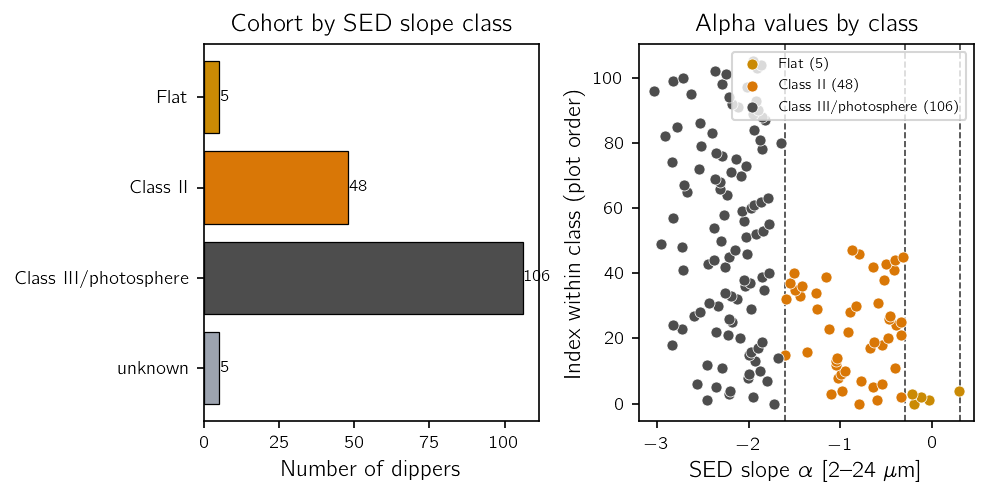

In [4]:
fig, axes = plt.subplots(1, 2, figsize=(FIG_SINGLE_COL_WIDTH * 1.85, 3.2), constrained_layout=True)

present_classes = [cls for cls in SED_ALPHA_CLASS_ORDER if class_counts.get(cls, 0) > 0]
counts = [int(class_counts[cls]) for cls in present_classes]
colors = [SED_ALPHA_CLASS_COLORS[cls] for cls in present_classes]

axes[0].barh(present_classes, counts, color=colors, edgecolor='black', linewidth=0.6)
axes[0].invert_yaxis()
axes[0].set_xlabel('Number of dippers')
axes[0].set_title('Cohort by SED slope class')
for idx, (cls, count) in enumerate(zip(present_classes, counts)):
    axes[0].text(count + 0.3, idx, str(count), va='center', fontsize=8)

finite = dippers[np.isfinite(dippers['sed_alpha'])].copy()
if finite.empty:
    axes[1].text(0.5, 0.5, 'No finite SED alpha values', ha='center', va='center', transform=axes[1].transAxes)
else:
    for cls in present_classes:
        subset = finite.loc[finite['sed_alpha_class'] == cls]
        if subset.empty:
            continue
        axes[1].scatter(
            subset['sed_alpha'],
            np.arange(len(subset)),
            s=28,
            color=SED_ALPHA_CLASS_COLORS[cls],
            edgecolors='white',
            linewidths=0.35,
            label=f'{cls} ({len(subset)})',
            zorder=3,
        )
    for value in (-1.6, -0.3, 0.3):
        axes[1].axvline(value, color='0.25', linestyle='--', linewidth=0.8, zorder=1)
    axes[1].set_xlabel(r'SED slope $\alpha$ [2--24 $\mu$m]')
    axes[1].set_ylabel('Index within class (plot order)')
    axes[1].set_title('Alpha values by class')
    axes[1].legend(loc='best', fontsize=7)

display(fig)
plt.close(fig)

## Plotting helpers

In [5]:
COMBINED_STYLE = dict(PUBLICATION_STYLE)
COMBINED_STYLE.update({
    'axes.unicode_minus': False,
    'axes.labelsize': 8.0,
    'xtick.labelsize': 6.8,
    'ytick.labelsize': 6.8,
    'legend.fontsize': 6.2,
    'axes.titlesize': 8.0,
})


def clean_value(value):
    try:
        missing = pd.isna(value)
        if isinstance(missing, (bool, np.bool_)) and missing:
            return None
    except Exception:
        pass
    if isinstance(value, np.integer):
        return int(value)
    if isinstance(value, np.floating):
        return float(value)
    return value


def payload_for(candidate_id: str) -> dict[str, object]:
    row = dippers_by_id.loc[str(candidate_id)]
    payload: dict[str, object] = {}
    raw = row.get('payload_json')
    if isinstance(raw, str) and raw.strip():
        try:
            parsed = json.loads(raw)
            if isinstance(parsed, dict):
                payload.update(parsed)
        except json.JSONDecodeError:
            pass
    for key, value in row.items():
        cleaned = clean_value(value)
        if cleaned is not None:
            payload[key] = cleaned
    payload['candidate_id'] = str(candidate_id)
    return payload


def _finite_text(value, fmt: str) -> str | None:
    try:
        number = float(value)
    except (TypeError, ValueError):
        return None
    return format(number, fmt) if math.isfinite(number) else None


def coordinate_name(candidate_id: str) -> str:
    row = dippers_by_id.loc[str(candidate_id)]
    ra = pd.to_numeric(row.get('ra'), errors='coerce')
    dec = pd.to_numeric(row.get('dec'), errors='coerce')
    if not (np.isfinite(ra) and np.isfinite(dec)):
        return str(candidate_id)
    coord = SkyCoord(float(ra) * u.deg, float(dec) * u.deg, frame='icrs')
    ra_text = coord.ra.to_string(unit=u.hourangle, sep='', precision=0, pad=True)
    dec_text = coord.dec.to_string(unit=u.deg, sep='', precision=0, pad=True, alwayssign=True)
    return f'J{ra_text}{dec_text}'


def fit_summary(candidate_id: str) -> dict[str, object]:
    rows = fits_by_id.get(str(candidate_id), pd.DataFrame())
    return {} if rows.empty else rows.iloc[0].to_dict()


def sed_points_for(candidate_id: str) -> pd.DataFrame:
    candidate_id = str(candidate_id)
    return build_sed_dataframe(
        payload_for(candidate_id),
        candidate_id=candidate_id,
        external_rows=photometry_by_id.get(candidate_id, pd.DataFrame()),
        extinction_mode='corrected',
    ).copy()


def resolved_neowise_path(candidate_id: str) -> Path | None:
    candidate_id = str(candidate_id)
    resolved = discover_external_lcs(
        candidate_id,
        payload_for(candidate_id),
        RUN_DIR,
        ['neowise'],
        default_results_root=RUN_DIR / 'results',
    )
    return resolved.get('neowise')


def wise_lightcurve_for(candidate_id: str) -> tuple[pd.DataFrame, list[str]]:
    parts: list[pd.DataFrame] = []
    sources: list[str] = []
    path = resolved_neowise_path(str(candidate_id))
    if path is not None and path.exists():
        frame = load_external_lc_frame('neowise', path)
        if frame.empty or 'mjd' not in frame.columns:
            frame = pd.DataFrame()
        if not frame.empty:
            added = False
            for band in ('W1', 'W2'):
                key = band.lower()
                mag_col = f'{key}mpro'
                err_col = f'{key}sigmpro'
                if mag_col not in frame.columns:
                    continue
                part = pd.DataFrame({
                    'mjd': pd.to_numeric(frame['mjd'], errors='coerce'),
                    'mag': pd.to_numeric(frame[mag_col], errors='coerce'),
                    'mag_err': pd.to_numeric(frame.get(err_col), errors='coerce'),
                    'band': band,
                    'source': 'NEOWISE',
                })
                part = part[np.isfinite(part['mjd']) & np.isfinite(part['mag'])].copy()
                if not part.empty:
                    parts.append(part)
                    added = True
            if added:
                sources.append('NEOWISE')
    if not parts:
        return pd.DataFrame(columns=['mjd', 'mag', 'mag_err', 'band', 'source']), []
    combined = pd.concat(parts, ignore_index=True)
    combined = combined.drop_duplicates(subset=['mjd', 'mag', 'band']).sort_values(['mjd', 'band'])
    return combined.reset_index(drop=True), sources


def _empty_panel(ax, message: str) -> None:
    ax.text(0.5, 0.5, message, transform=ax.transAxes, ha='center', va='center', fontsize=7.0)
    ax.set_xticks([])
    ax.set_yticks([])
    for spine in ax.spines.values():
        spine.set_visible(True)
        spine.set_color('black')
        spine.set_linewidth(0.75)


def _asassn_jd_minus_2458000(lc, plot_df: pd.DataFrame) -> pd.Series:
    time = pd.to_numeric(plot_df['time'], errors='coerce')
    finite = time[np.isfinite(time)]
    median = float(finite.median()) if not finite.empty else np.nan
    if np.isfinite(median) and median > 2_000_000:
        return time - 2_458_000.0
    if np.isfinite(median) and median > 40_000:
        return time - 57_999.5
    if np.isfinite(median) and median > 5_000:
        return time - 8_000.0
    return time


def _median_center(frame: pd.DataFrame) -> pd.DataFrame:
    out = frame.copy()
    centers = out.groupby('band', observed=True)['mag'].transform('median')
    out['centered_mag'] = out['mag'] - centers
    return out


def plot_centered_lightcurve_panel(ax, candidate_id: str) -> dict[str, dict[str, object]]:
    row = dippers_by_id.loc[str(candidate_id)]
    lc_path = Path(str(row.get('lc_path') or ''))
    optical_parts: list[pd.DataFrame] = []
    optical_status = {'status': 'missing', 'n_points': 0, 'path': str(lc_path)}
    if lc_path.exists():
        lc = load_lightcurve(lc_path)
        plot_df = filter_lightcurve(lc, max_error=1.0)
        if not plot_df.empty:
            optical = pd.DataFrame({
                'jd_minus_2458000': _asassn_jd_minus_2458000(lc, plot_df),
                'mag': pd.to_numeric(plot_df['value'], errors='coerce'),
                'mag_err': pd.to_numeric(plot_df['value_error'], errors='coerce'),
                'band': plot_df['band'].astype(str),
                'survey': 'ASAS-SN',
            })
            optical = optical[np.isfinite(optical['jd_minus_2458000']) & np.isfinite(optical['mag'])]
            if not optical.empty:
                optical_parts.append(_median_center(optical))
                optical_status = {'status': 'ok', 'n_points': len(optical), 'path': str(lc_path)}
            else:
                optical_status['status'] = 'empty'

    wise, sources = wise_lightcurve_for(candidate_id)
    wise_status = {'status': 'missing', 'n_points': 0, 'sources': ''}
    if not wise.empty:
        wise_plot = wise.copy()
        wise_plot['jd_minus_2458000'] = pd.to_numeric(wise_plot['mjd'], errors='coerce') - 57_999.5
        wise_plot = wise_plot[np.isfinite(wise_plot['jd_minus_2458000']) & np.isfinite(wise_plot['mag'])]
        if not wise_plot.empty:
            optical_parts.append(_median_center(wise_plot))
            wise_status = {
                'status': 'ok',
                'n_points': len(wise_plot),
                'sources': ' + '.join(sources),
            }

    if not optical_parts:
        _empty_panel(ax, 'No ASAS-SN or NEOWISE light curves available')
        return {'optical': optical_status, 'wise': wise_status}

    combined = pd.concat(optical_parts, ignore_index=True)
    plot_lightcurve_panel(
        ax, combined,
        group_by='band', show_errorbars=True, time_offset='none', legend='none',
        marker_size=2.2, time_col='jd_minus_2458000', value_col='centered_mag',
        error_col='mag_err', band_col='band', y_label='Relative magnitude [mag]',
        default_invert_y=True, xlabel='JD - 2458000 [d]',
        ylabel='Relative magnitude [mag]',
    )

    handles, labels = ax.get_legend_handles_labels()
    label_order = {'V': 0, 'g': 1, 'W1': 2, 'W2': 3}
    ordered = sorted(zip(handles, labels), key=lambda pair: label_order.get(pair[1], 99))
    if ordered:
        legend = ax.legend(
            [item[0] for item in ordered], [item[1] for item in ordered],
            loc='best', ncol=2,
            frameon=True, fancybox=False,
            facecolor='white', edgecolor='black', framealpha=1.0,
            borderpad=0.35, handletextpad=0.45, columnspacing=0.9,
        )
        legend.get_frame().set_linewidth(0.75)
    return {'optical': optical_status, 'wise': wise_status}


def plot_sed_panel(ax, candidate_id: str) -> dict[str, object]:
    candidate_id = str(candidate_id)
    points = sed_points_for(candidate_id)
    curve = curves_by_id.get(candidate_id, pd.DataFrame()).copy()
    fit = fit_summary(candidate_id)
    lsun_erg_s = 3.828e33

    if not curve.empty:
        curve_x = pd.to_numeric(curve['wavelength_angstrom'], errors='coerce').to_numpy(dtype=float)
        curve_y = pd.to_numeric(curve['lambda_l_lambda'], errors='coerce').to_numpy(dtype=float) / lsun_erg_s
        good = np.isfinite(curve_x) & np.isfinite(curve_y) & (curve_x > 0) & (curve_y > 0)
        if np.any(good):
            ax.plot(curve_x[good], curve_y[good], color='black', lw=1.0, zorder=2)

    x = pd.to_numeric(points.get('lambda_eff_angstrom'), errors='coerce').to_numpy(dtype=float)
    y = pd.to_numeric(points.get('lambda_l_lambda'), errors='coerce').to_numpy(dtype=float) / lsun_erg_s
    yerr = pd.to_numeric(points.get('lambda_l_lambda_err'), errors='coerce').to_numpy(dtype=float) / lsun_erg_s
    phot_good = np.isfinite(x) & np.isfinite(y) & (x > 0) & (y > 0)

    groups = (
        (phot_good & (x < 1.0e4), '#7c89d0'),
        (phot_good & (x >= 1.0e4) & (x < 3.0e4), '#d85c70'),
        (phot_good & (x >= 3.0e4), '#e68613'),
    )
    for mask, color in groups:
        if not np.any(mask):
            continue
        with_error = mask & np.isfinite(yerr) & (yerr > 0)
        if np.any(with_error):
            ax.errorbar(
                x[with_error], y[with_error], yerr=yerr[with_error],
                fmt='none', ecolor=color, elinewidth=0.55, capsize=1.4, alpha=0.82, zorder=3,
            )
        ax.scatter(
            x[mask], y[mask], s=20, marker='o', color=color,
            edgecolor='black', linewidth=0.40, zorder=4,
        )

    ax.set_xscale('log')
    ax.set_yscale('log')
    if np.any(phot_good):
        ax.set_xlim(float(np.nanmin(x[phot_good])) * 0.76, float(np.nanmax(x[phot_good])) * 1.18)
        ax.set_ylim(float(np.nanmin(y[phot_good])) * 0.55, float(np.nanmax(y[phot_good])) * 1.65)

    bs = chr(92)
    ax.set_xlabel(f'${bs}lambda{bs},[{bs}mathrm{{{bs}AA}}]$', labelpad=2.0)
    ax.set_ylabel(f'${bs}lambda L_{{{bs}lambda}}$ [$L_{{{bs}odot}}$]', labelpad=2.5)
    ax.grid(False, which='both')
    for spine in ax.spines.values():
        spine.set_visible(True)
        spine.set_color('black')
        spine.set_linewidth(0.75)
    ax.tick_params(which='major', direction='in', top=True, right=True, length=3.8, width=0.75)
    ax.tick_params(which='minor', direction='in', top=True, right=True, length=2.0, width=0.6)

    row = dippers_by_id.loc[candidate_id]
    alpha = _finite_text(row.get('sed_alpha'), '+.2f')
    teff = _finite_text(fit.get('teff_k'), '.0f')
    radius = _finite_text(fit.get('radius_rsun'), '.2f')
    fit_parts = []
    fit_parts.append(f'${bs}alpha = {alpha}$' if alpha is not None else f'${bs}alpha = {bs}mathrm{{NA}}$')
    if teff is not None:
        fit_parts.append(f'$T_{{{bs}mathrm{{eff}}}} = {teff}{bs},{bs}mathrm{{K}}$')
    if radius is not None:
        fit_parts.append(f'$R = {radius}{bs},R_{{{bs}odot}}$')
    if fit_parts:
        ax.text(0.98, 0.84, '\n'.join(fit_parts), transform=ax.transAxes,
                ha='right', va='top', fontsize=7.2, color='black', zorder=7)
    sed_available = bool(np.any(phot_good))
    return {'status': 'ok' if sed_available else 'missing', 'n_points': int(phot_good.sum())}


def candidate_header_text(candidate_id: str) -> str:
    return coordinate_name(candidate_id)


def candidate_combined_figure(candidate_id: str):
    candidate_id = str(candidate_id)
    if candidate_id not in dippers_by_id.index:
        raise KeyError(f'{candidate_id} is not in the current marked-dipper cohort.')

    with plt.rc_context(COMBINED_STYLE):
        fig, axes = plt.subplots(
            2, 1,
            figsize=(FIG_SINGLE_COL_WIDTH, 5.25),
            gridspec_kw={'height_ratios': [1.0, 1.22]},
            constrained_layout=True,
        )
        fig.patch.set_facecolor('white')
        for ax in axes:
            ax.set_facecolor('white')

        lightcurve_status = plot_centered_lightcurve_panel(axes[0], candidate_id)
        sed_status = plot_sed_panel(axes[1], candidate_id)

        row = dippers_by_id.loc[candidate_id]
        class_color = SED_ALPHA_CLASS_COLORS.get(str(row.get('sed_alpha_class')), '#9ca3af')
        axes[0].text(
            0.88, 1.0, candidate_header_text(candidate_id),
            transform=axes[0].transAxes, ha='right', va='center',
            fontsize=8.2, fontweight='normal', clip_on=False, zorder=20,
            bbox={
                'boxstyle': 'square,pad=0.12',
                'facecolor': 'white',
                'edgecolor': class_color,
                'linewidth': 1.1,
            },
        )
        return fig, {
            'optical': lightcurve_status['optical'],
            'wise': lightcurve_status['wise'],
            'sed': sed_status,
        }


def safe_filename(text: str) -> str:
    return re.sub(r'[^A-Za-z0-9._-]+', '_', str(text)).strip('_') or 'candidate'


def candidates_for_class(sed_alpha_class: str) -> list[str]:
    subset = dippers.loc[dippers['sed_alpha_class'] == sed_alpha_class].copy()
    subset = subset.sort_values(['sed_alpha', 'candidate_id'], ascending=[False, True], na_position='last')
    return subset['candidate_id'].astype(str).tolist()

## Render all dippers grouped by SED slope class

### `Flat` (5 candidates)

<span style='color:#ca8a04; font-weight:600'>2--24 µm slope class</span>

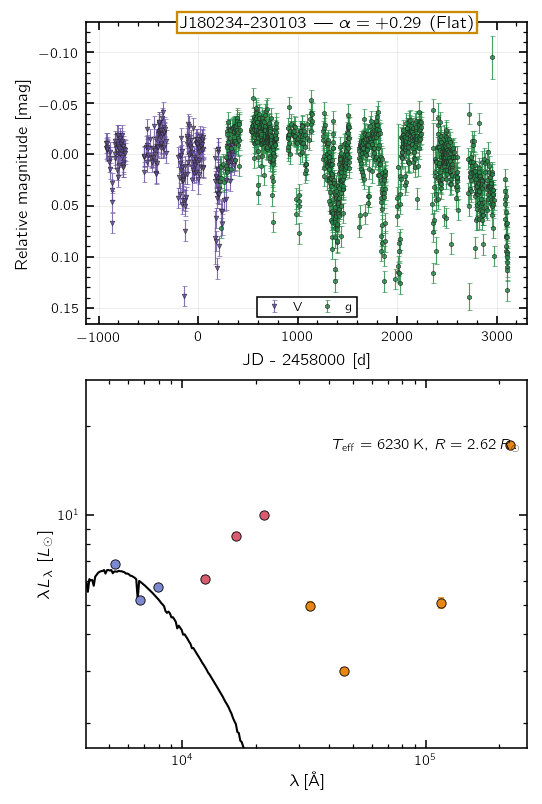

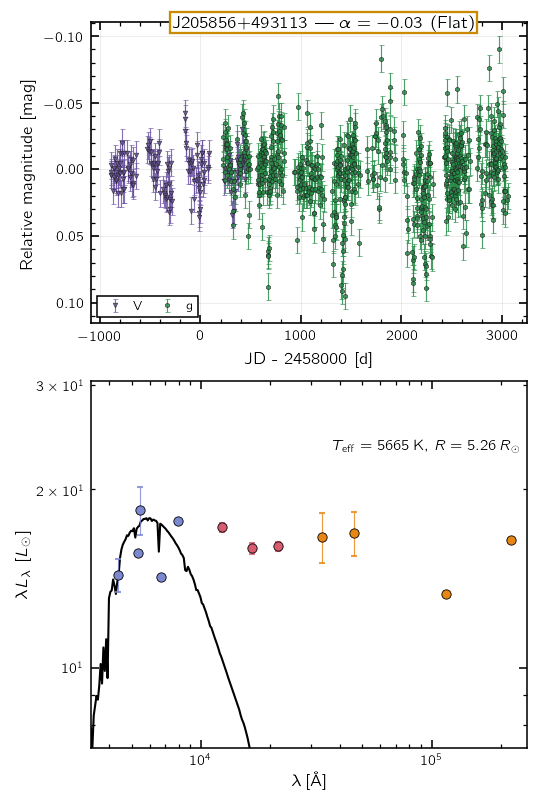

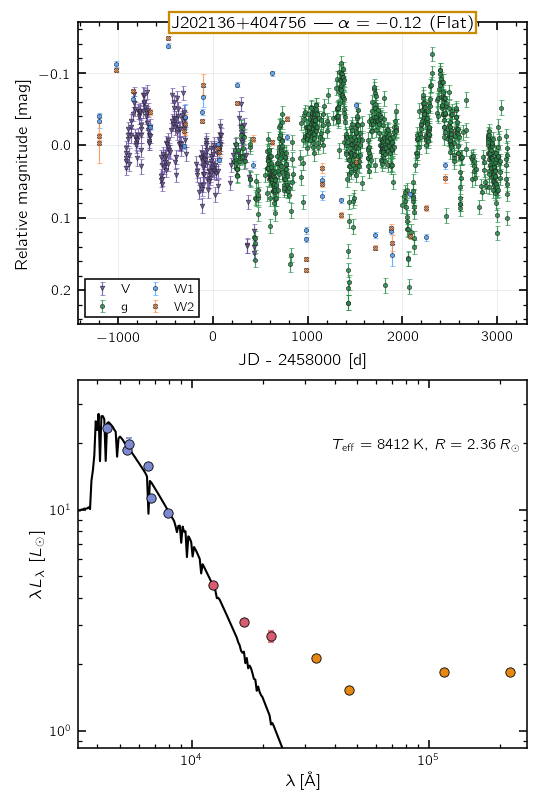

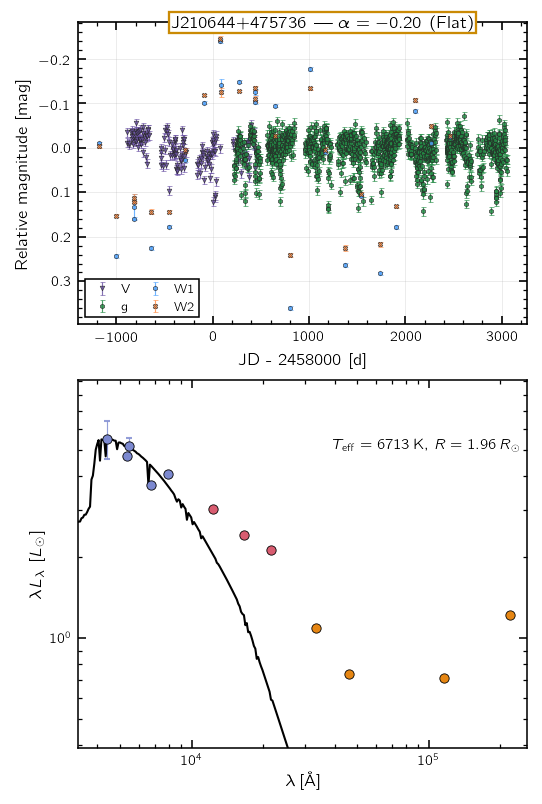

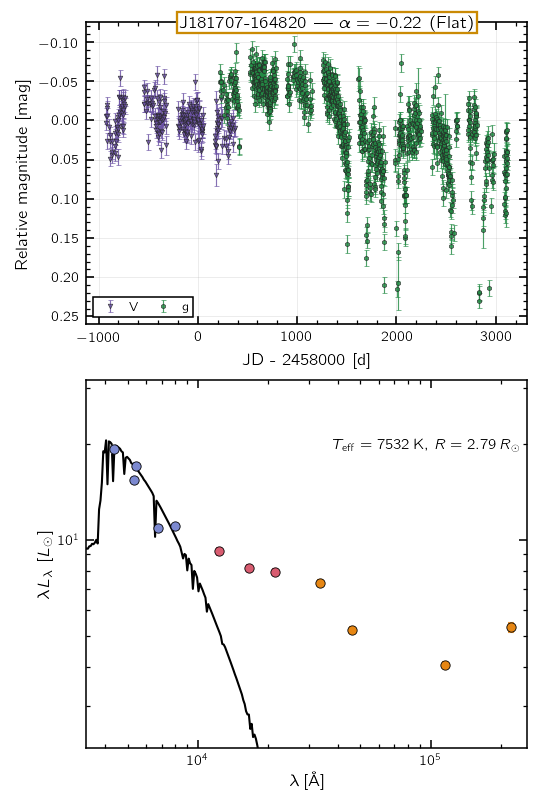

### `Class II` (48 candidates)

<span style='color:#d97706; font-weight:600'>2--24 µm slope class</span>

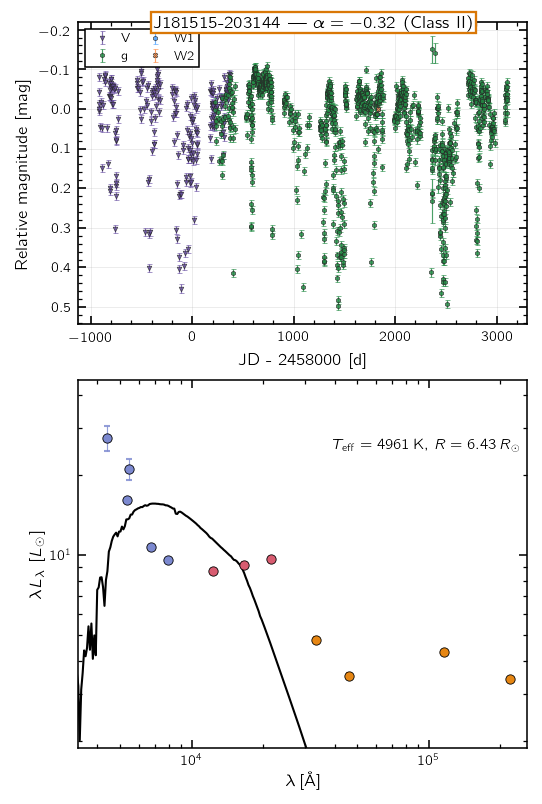

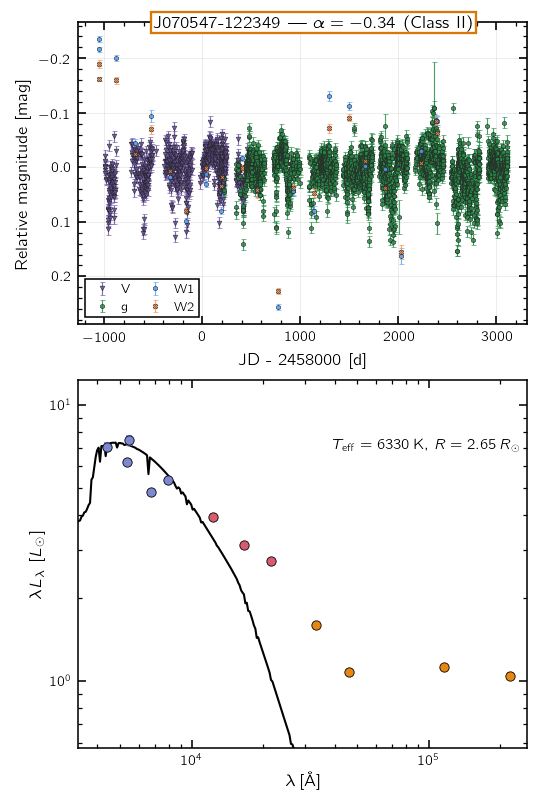

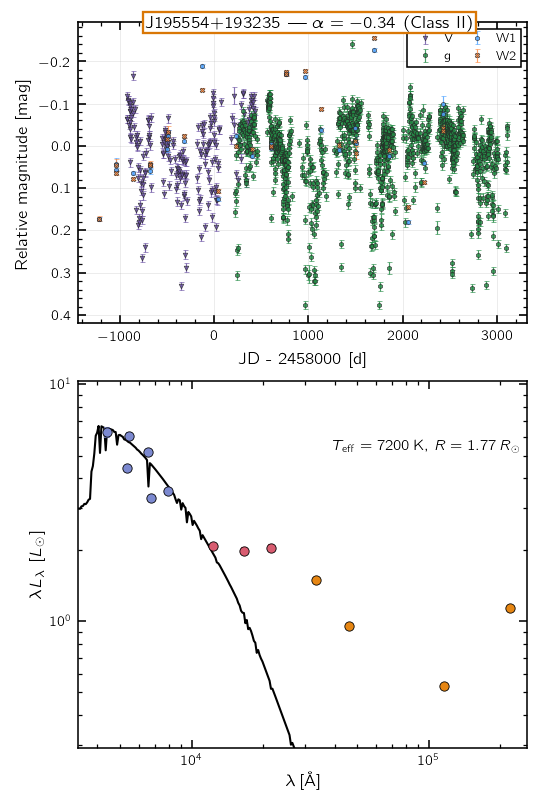

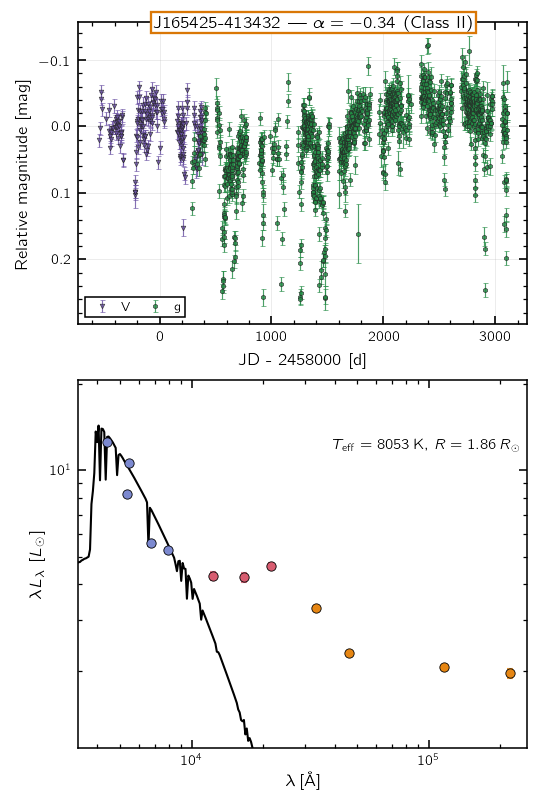

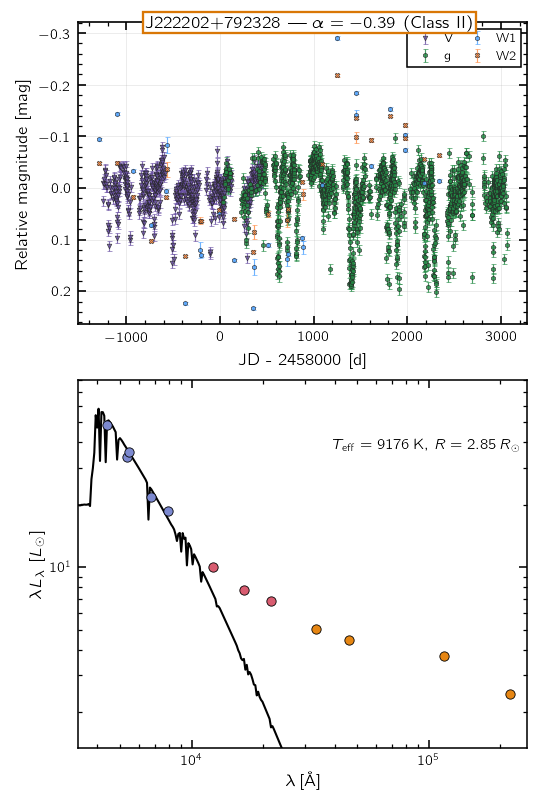

...

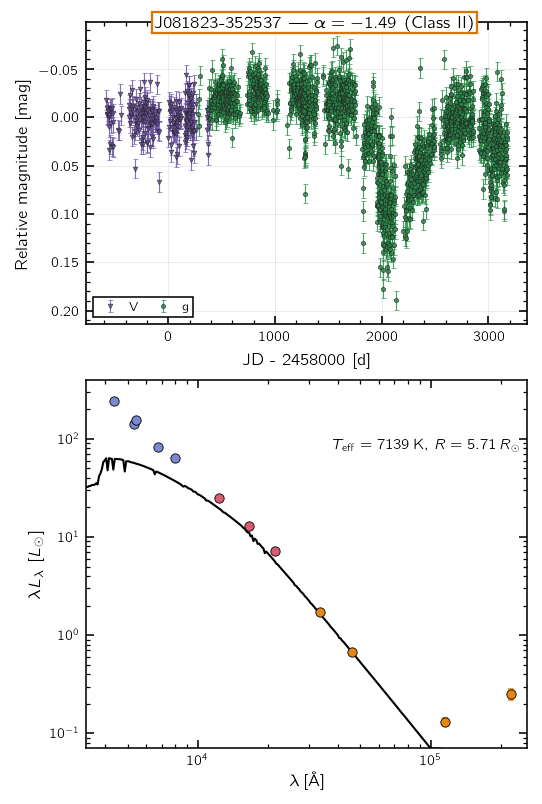

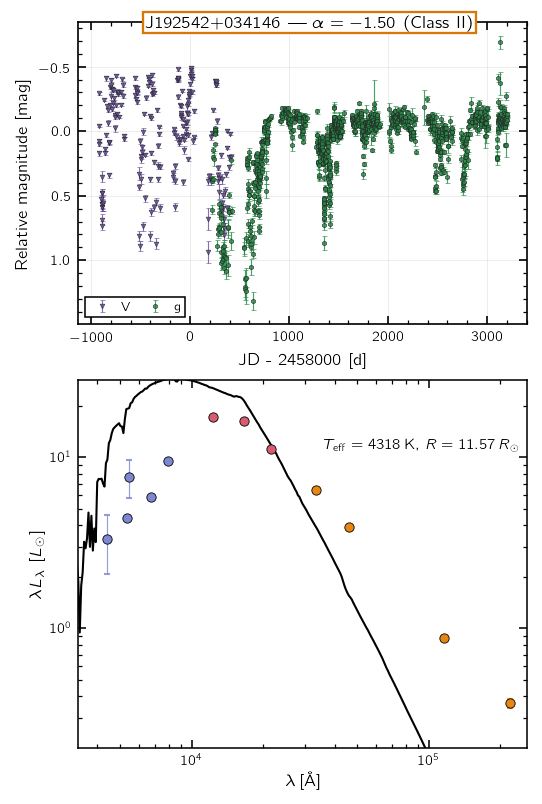

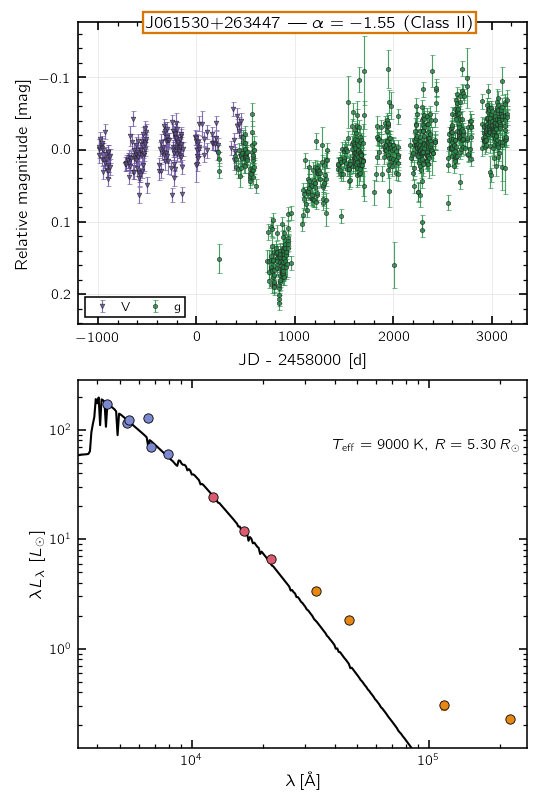

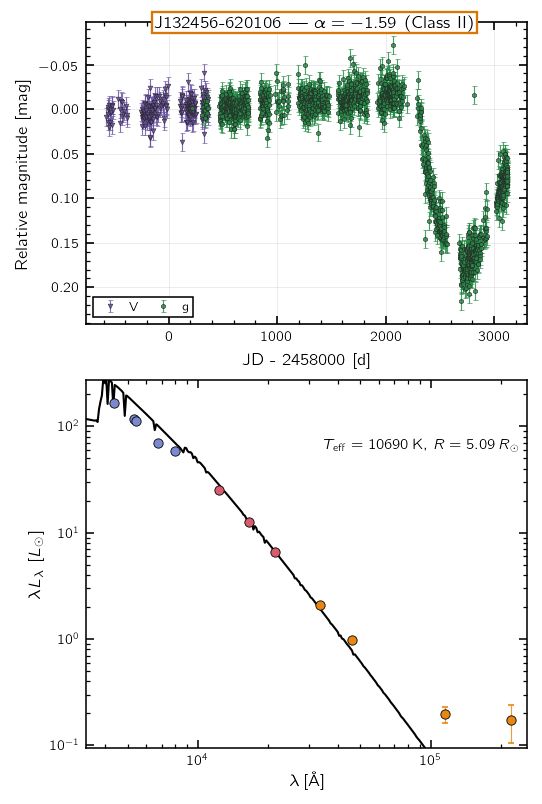

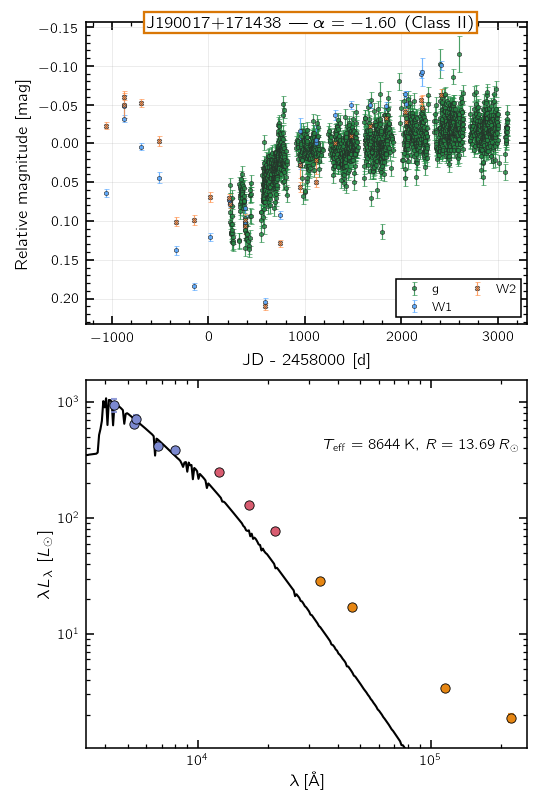

### `Class III/photosphere` (106 candidates)

<span style='color:#4d4d4d; font-weight:600'>2--24 µm slope class</span>

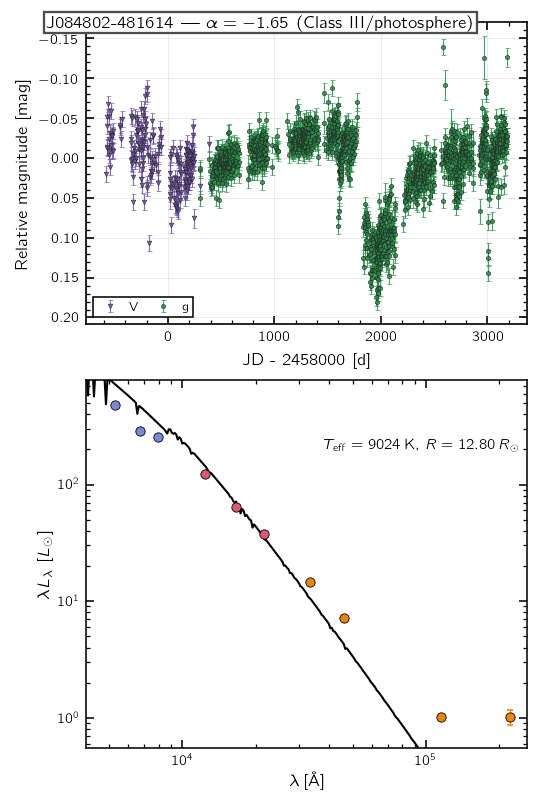

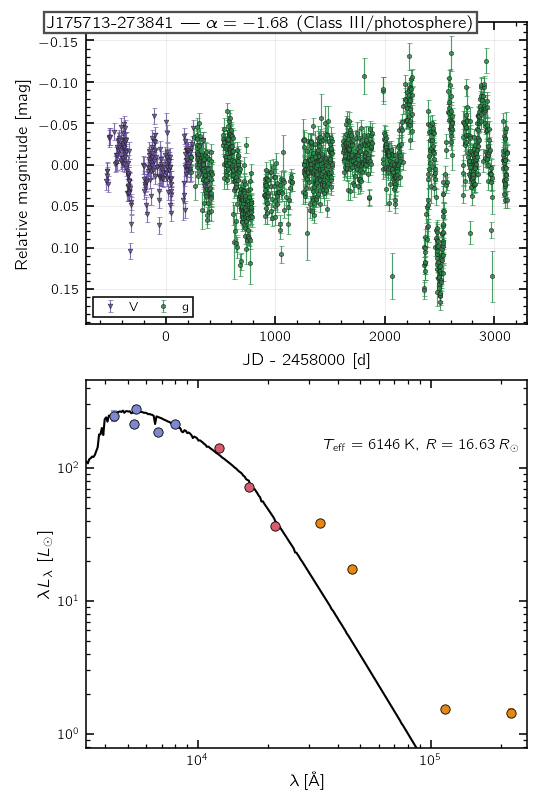

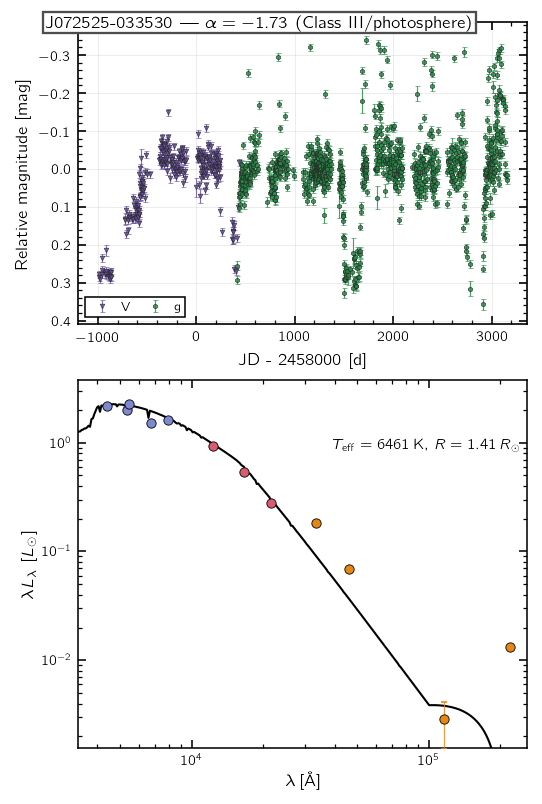

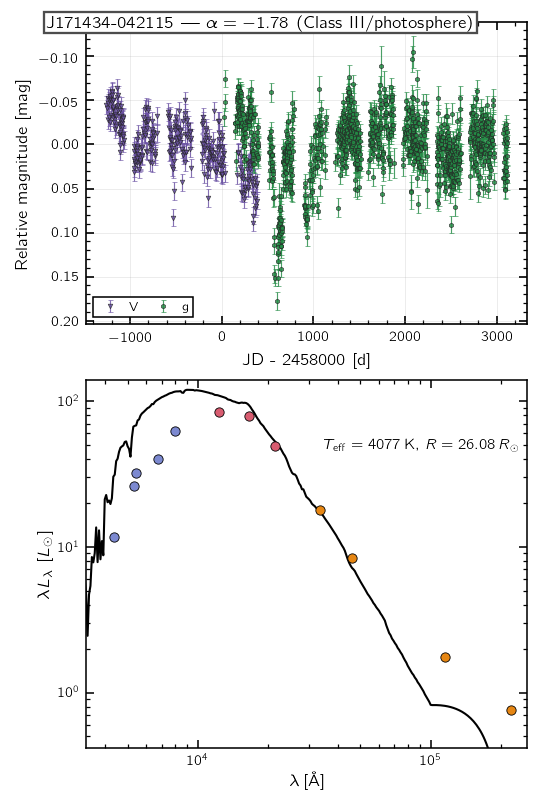

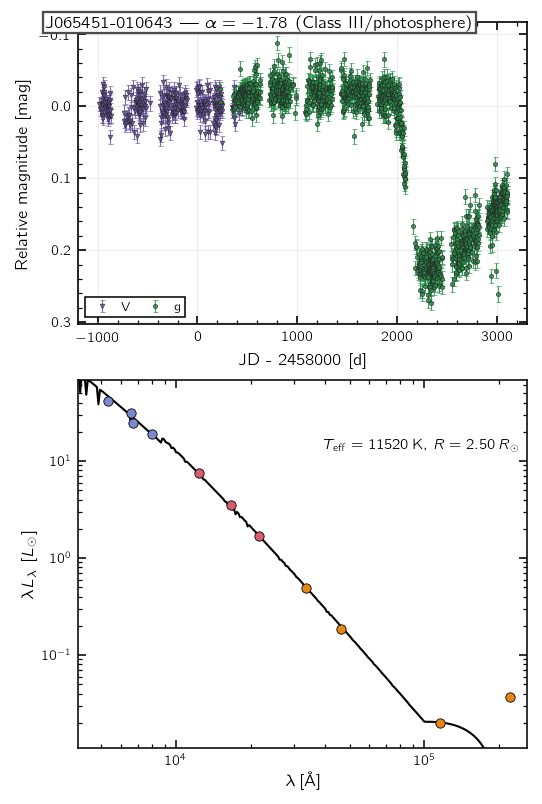

...

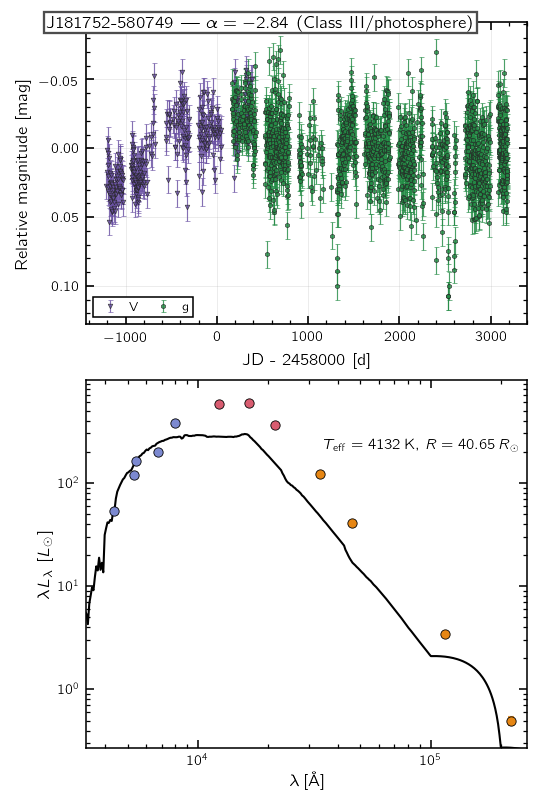

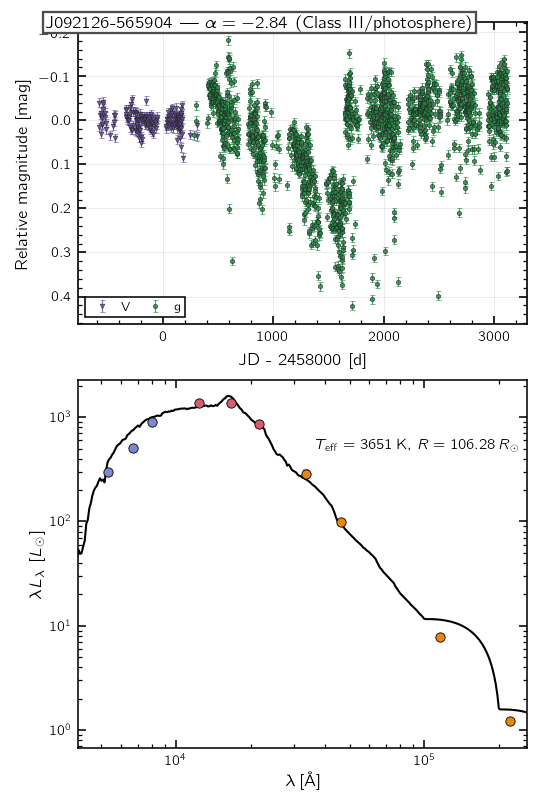

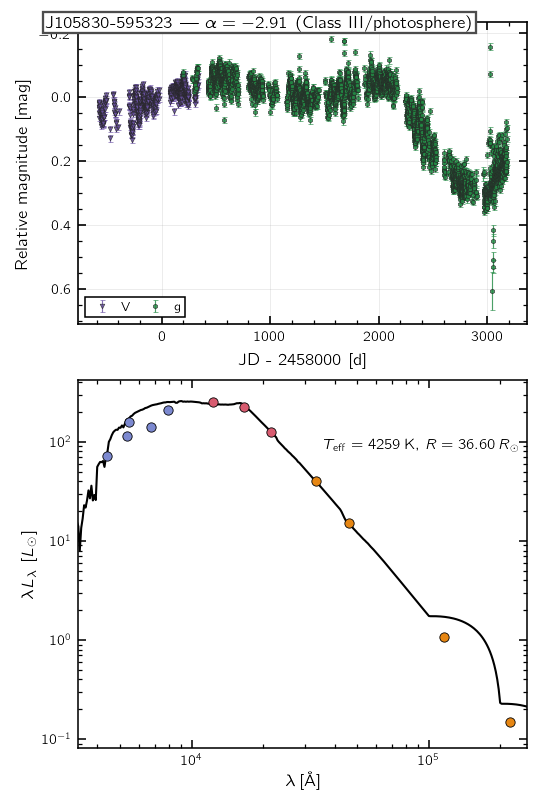

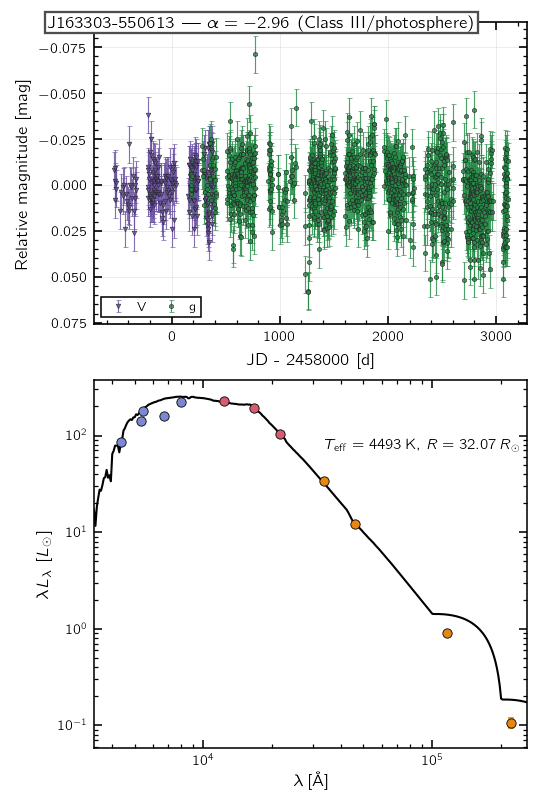

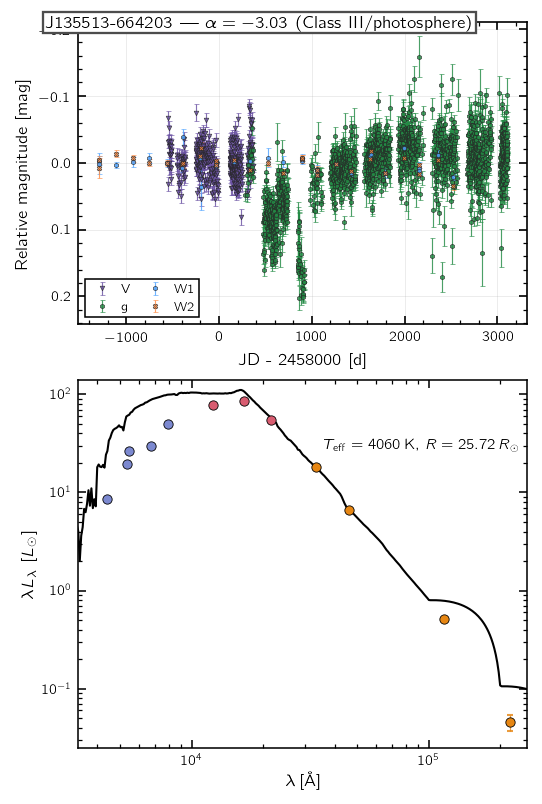

### `unknown` (5 candidates)

<span style='color:#9ca3af; font-weight:600'>2--24 µm slope class</span>

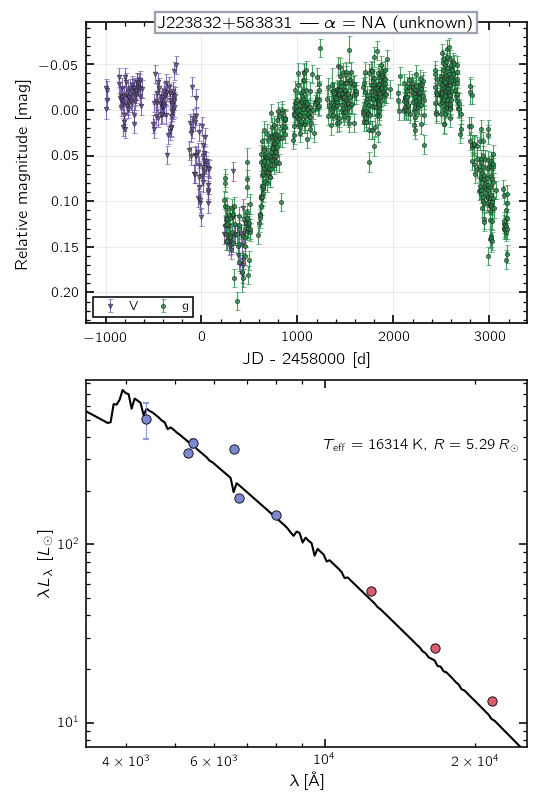

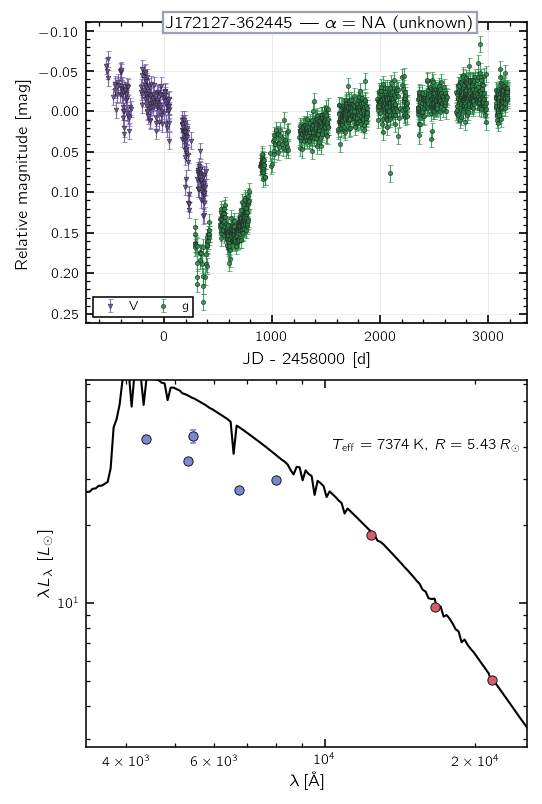

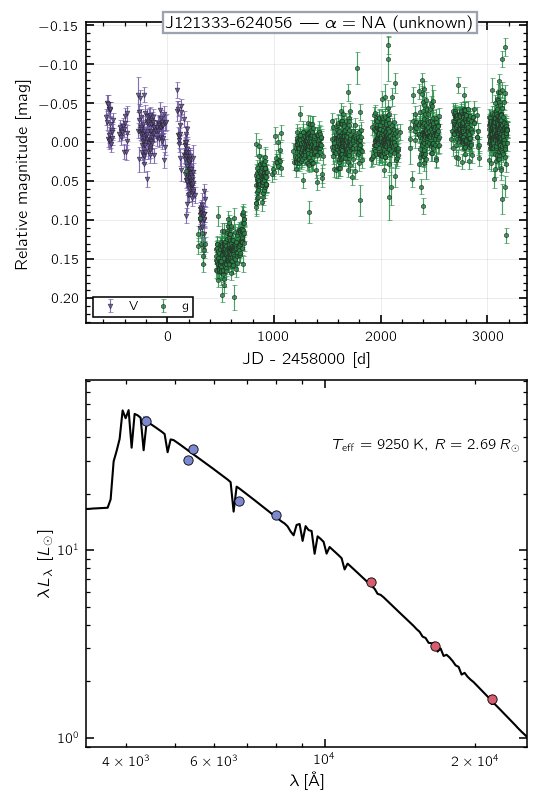

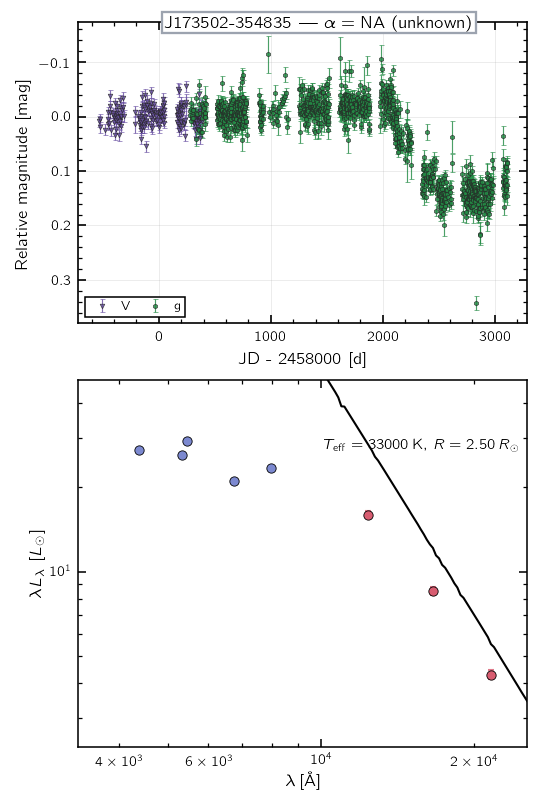

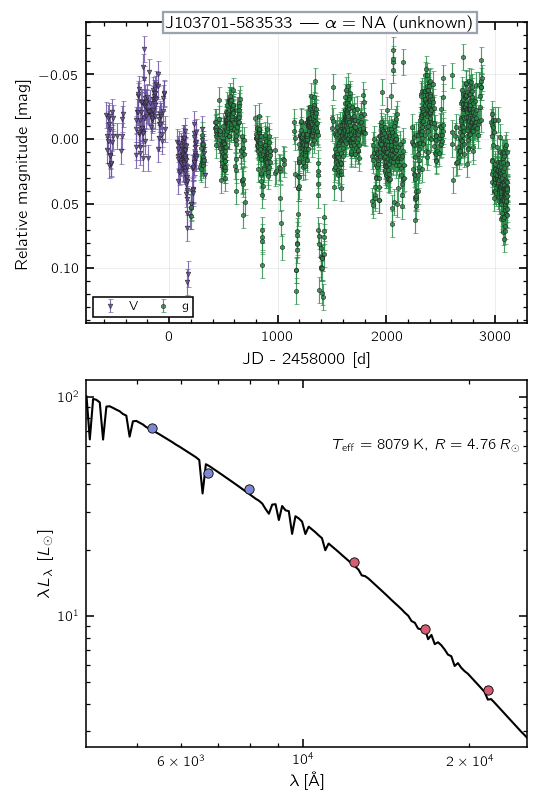

In [6]:
def display_class_atlas(sed_alpha_class: str, candidate_list: list[str]) -> None:
    color = SED_ALPHA_CLASS_COLORS.get(sed_alpha_class, '#9ca3af')
    display(Markdown(
        f"### `{sed_alpha_class}` ({len(candidate_list)} candidates)\n\n"
        f"<span style='color:{color}; font-weight:600'>2--24 µm slope class</span>"
    ))
    if not candidate_list:
        display(Markdown('_No candidates in this class._'))
        return

    for candidate_id in candidate_list:
        fig, _status = candidate_combined_figure(candidate_id)
        display(fig)
        plt.close(fig)


if DISPLAY_ALL:
    for sed_alpha_class in SED_ALPHA_CLASS_ORDER:
        ids = candidates_for_class(sed_alpha_class)
        if DISPLAY_LIMIT_PER_CLASS is not None:
            ids = ids[: int(DISPLAY_LIMIT_PER_CLASS)]
        if not ids and class_counts.get(sed_alpha_class, 0) == 0:
            continue
        display_class_atlas(sed_alpha_class, ids)
else:
    print('DISPLAY_ALL is False; no cohort figures were rendered inline.')

## Optional PDF export (one merged file plus per-class PDFs)

In [7]:
def export_class_pdfs(*, merge_atlas: bool = True) -> pd.DataFrame:
    OUTPUT_DIR.mkdir(parents=True, exist_ok=True)
    PDF_DIR.mkdir(parents=True, exist_ok=True)
    records: list[dict[str, object]] = []
    merged_path = OUTPUT_DIR / 'marked_dipper_sed_slope_atlas.pdf'
    merged_writer = PdfPages(merged_path, metadata={'Creator': 'MALCA'}) if merge_atlas else None

    try:
        for sed_alpha_class in SED_ALPHA_CLASS_ORDER:
            export_ids = candidates_for_class(sed_alpha_class)
            if EXPORT_LIMIT_PER_CLASS is not None:
                export_ids = export_ids[: int(EXPORT_LIMIT_PER_CLASS)]
            if not export_ids:
                continue

            class_slug = safe_filename(sed_alpha_class)
            class_writer = PdfPages(
                PDF_DIR / f'sed_slope_{class_slug}.pdf',
                metadata={'Creator': 'MALCA', 'Title': sed_alpha_class},
            )
            try:
                for index, candidate_id in enumerate(export_ids, start=1):
                    try:
                        fig, status = candidate_combined_figure(candidate_id)
                        class_writer.savefig(fig, dpi=300, bbox_inches='tight', pad_inches=0.06)
                        if merged_writer is not None:
                            merged_writer.savefig(fig, dpi=300, bbox_inches='tight', pad_inches=0.06)
                        plt.close(fig)
                        records.append({
                            'candidate_id': candidate_id,
                            'sed_alpha_class': sed_alpha_class,
                            'status': 'ok',
                            'optical_status': status['optical']['status'],
                            'wise_status': status['wise']['status'],
                            'sed_status': status['sed']['status'],
                        })
                    except Exception as exc:
                        records.append({
                            'candidate_id': candidate_id,
                            'sed_alpha_class': sed_alpha_class,
                            'status': 'error',
                            'optical_status': '',
                            'wise_status': '',
                            'sed_status': '',
                            'warning': str(exc),
                        })
                    if index == 1 or index % 10 == 0 or index == len(export_ids):
                        print(f'{sed_alpha_class}: exported {index}/{len(export_ids)}')
            finally:
                class_writer.close()
    finally:
        if merged_writer is not None:
            merged_writer.close()

    manifest = pd.DataFrame(records)
    manifest_path = OUTPUT_DIR / 'marked_dipper_sed_slope_atlas_manifest.csv'
    manifest.to_csv(manifest_path, index=False)
    print(f'Wrote manifest: {manifest_path}')
    if merge_atlas:
        print(f'Wrote merged atlas: {merged_path}')
    return manifest


if EXPORT_PDF:
    export_manifest = export_class_pdfs(merge_atlas=MERGE_CLASS_PDFS)
    display(export_manifest)
else:
    print('EXPORT_PDF is False; skipped PDF export.')

EXPORT_PDF is False; skipped PDF export.
